In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import torch
import sys
import pandas as pd
from pycocotools import mask as maskUtils
import torch

#sys.path.append('../yolov5/')
sys.path.append('../src')

from reef_detector import ReefDetector
from yolo_utils import plot_yolo_pred

import fastai
from fastai.vision.all import *
from fastai.vision.gan import *
from boxtractor import Boxtractor

In [3]:
matplotlib.use('nbAgg')

In [25]:
fold = 0
dir_path = '../input/yolo_ds/'
with open(dir_path + f'{fold}_val_images.txt') as file:
    lines = file.readlines()
    val_fns = [os.path.join(dir_path, fn.replace('\n','')) for fn in lines]
print(len(val_fns))
val_fns[0]

5280


'../input/yolo_ds/./images/0-1851.jpg'

In [26]:
# reduce the number of samples in fold 0 and take only frame indices above 9186
val_fns = [fn for fn in val_fns if int(os.path.basename(fn).split('-')[1].replace('.jpg','')) > 9186]
len(val_fns)

2188

In [6]:
yolo_model = '../yolov5/reef/SC.3_OBJW3_yolov5l-15ep0/weights/best.pt' #'../yolov5/reef/3000_fold0_yolov5l-20ep0/weights/best.pt'
reef_detector = ReefDetector(
    weights=yolo_model,
    im_size=1280,
    conf_thres=0.20,
    device='cuda',
    hub_path='../yolov5/'
)

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 
Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 


In [7]:
img_fn = val_fns[68]
img = cv2.cvtColor(
    cv2.imread(img_fn),
    cv2.COLOR_BGR2RGB
)
#plt.imshow(img)
#plt.show()

In [8]:
def imagewise_matches(threshold, iou):
    """
    Computes the tp,fp and fn at a given iou_threshold.
    Args:
        threshold (float): iou Threshold.
        iou (np array): IoU matrix. (pred x gts) preds should be in conf descendin order
    Returns:
        int: Number of true positives,
        int: Number of false positives,
        int: Number of false negatives.
    """
    if iou.ndim < 2:
        return 0,0,0
    
    tp = 0
    fp = 0
    col_indices = list(range(iou.shape[1]))
    used_col_indices = []
    for k, pred_row in enumerate(iou):
        # no more gts left
        if len(col_indices) == 0:
            # add remaining preds to fps and break
            fp += len(iou) - k
            break
        
        # select the max iou for the pred box from free gts
        max_iou = np.max(pred_row[np.array(col_indices)])
        
        # Check the original column index of selection
        pred_row_blocked = pred_row.copy()
        if len(used_col_indices) > 0:
            pred_row_blocked[np.array(used_col_indices)] = -1
        max_iou_col = list(pred_row_blocked).index(max_iou)
        
        # if the iou is above th, it's a match
        if max_iou > threshold:
            tp += 1
            col_indices.remove(max_iou_col)
            used_col_indices.append(max_iou_col)
        else:
            fp += 1
    
    # false negatives are the unmatched gts
    fn = len(col_indices)
    return tp, fp, fn

def f2_score(tp, fp, fn):
    beta = 2
    a = (1+beta**2) * tp
    b = (1+beta**2) * tp + (beta**2)*fn + fp
    return a / b if b != 0 else 1

def precision(tp, fp, fn):
    return tp / (tp + fp + 1e-16)

def recall(tp, fp, fn):
    return tp / (tp + fn + 1e-16)

def f2_at_3_to_8(ious):
    """ 
    Calculates imagewise f2@.3:.8, tps, fps and fns from iou matrix
    
    Returns:
    f2s : f2 scores at each 11 iou threshold
    tps : tp at each 11 iou threshold
    tps : fp at each 11 iou threshold
    fns : fn at each 11 iou threshold
    """
    ths = np.linspace(0.3,0.8,11)
    f2s = []
    tps, fps, fns = [], [], []
    for iou_th in ths:
        tp, fp, fn = imagewise_matches(iou_th, ious)
        f2s.append(f2_score(tp,fp,fn))
        tps.append(tp)
        fps.append(fp)
        fns.append(fn)
    return np.array(f2s), np.array(tps), np.array(fps), np.array(fns) 

In [9]:
pred = reef_detector(img)
pred

[[1124, 250, 1205, 311, 0.9425308108329773],
 [717, 461, 780, 514, 0.9233056902885437]]

In [10]:
pred = reef_detector(img, augment=True)
pred

[[1122, 245, 1205, 313, 0.9528165459632874],
 [717, 459, 779, 513, 0.9338487386703491]]

In [12]:
def validate_pred_box(starfish_seg_mask, box_height, box_width, validation_th = -0.02):
    # center crop
    margin=24
    crop = starfish_seg_mask[margin:-margin,margin:-margin]
    mean_val = np.mean(crop)
    
    box_area = box_height * box_width
    coeff_area = -2.086e-05
    coeff_mean = 4.360e-03
    pred_iou = coeff_area * box_area + coeff_mean * mean_val
    
    return pred_iou > validation_th

In [14]:
def get_dummy_dls(bs:int=32, size:int=128):
    dblock = DataBlock(
        blocks=(ImageBlock, ImageBlock),
        get_items=get_image_files,
        get_y = lambda x: x,
        splitter=RandomSplitter(),
        item_tfms=Resize(size),
        batch_tfms=[*aug_transforms(max_zoom=2.),
                    Normalize.from_stats(*imagenet_stats)])
    dls = dblock.dataloaders('../input/tensorflow-great-barrier-reef/train_images/video_0/', bs=bs, path='.')
    dls.c = 3 # For 1 channel image
    return dls

dummy_dls = get_dummy_dls(bs=32)

def create_inference_learner(dls):
    return unet_learner(
        dls, 
        arch=resnet18, 
        lr=0.001,
        wd=1e-3,
        loss_func = MSELossFlat(),              
        blur=True, 
        norm_type=NormType.Weight, 
        self_attention=True)

learn_validator = create_inference_learner(dummy_dls)

learn_validator.model.load_state_dict(torch.load(f'../output/starfish_seg_resnet18_unet_{fold}.pth'))

<All keys matched successfully>

In [15]:
boxtractor = Boxtractor()
pred_crops = boxtractor.boxtract(img, pred)

good_pred = []
for p, crop in zip(pred, pred_crops):
    pred_mask = learn_validator.predict(crop)
    pred_height = p[3]-p[1]
    pred_width = p[2]-p[0]
    if validate_pred_box(
        pred_mask[0].detach().numpy()[0], pred_height, pred_width
    ):
        good_pred.append(p)
good_pred

[[1122, 245, 1205, 313, 0.9528165459632874],
 [717, 459, 779, 513, 0.9338487386703491]]

<IPython.core.display.Javascript object>


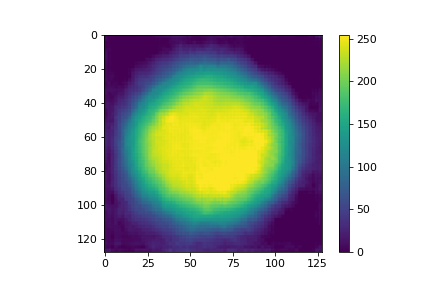

In [16]:
plt.close('all')
plt.imshow(pred_mask[0].detach().numpy()[0]) #pred_crops[0])
plt.colorbar()
plt.show()

In [17]:
gts = []
with open(img_fn.replace('/images/','/labels/').replace('.png','.txt').replace('.jpg','.txt')) as f:
    annos = f.readlines()

im_h, im_w = img.shape[:2]
for anno in annos:
    lbl, xc, yc, w, h = anno.split(' ')
    xc = float(xc) * im_w
    yc = float(yc) * im_h
    w = float(w) * im_w
    h = float(h) * im_h
    x = (xc - w / 2)
    y = (yc - h / 2)
    gts.append([
        x,y,w,h
    ])

preds_xywh = [
    [
        p[0], 
        p[1],
        p[2] - p[0],
        p[3] - p[1],
    ] for p in good_pred
]
# box format : x,y,w,h
ious = maskUtils.iou(preds_xywh, gts, [0]*len(gts))
print(ious)
print('tp,fp,fn')
print(imagewise_matches(0.5, ious))
f2_at_3_to_8(ious)

[[    0.69942           0]
 [          0     0.66939]]
tp,fp,fn
(2, 0, 0)


(array([          1,           1,           1,           1,           1,           1,           1,           1,           0,           0,           0]),
 array([2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2]))

<IPython.core.display.Javascript object>


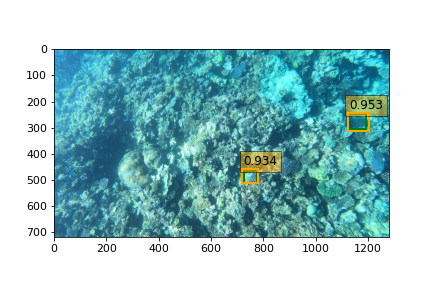

In [18]:
plt.close('all')
f, ax = plt.subplots(1,1)
plot_yolo_pred(img_fn, good_pred, ax=ax)
plt.show()

In [19]:
from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(9, 9))
    plt.axis('off')
    im = plt.imshow(ims[0])

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//12)    

## Tracking

In [14]:
from norfair import Detection, Tracker, Video, draw_tracked_objects, draw_debug_metrics

# Helper to convert bbox in format [x_min, y_min, x_max, y_max, score] to norfair.Detection class
def to_norfair(detects, frame_id):
    result = []
    for x_min, y_min, x_max, y_max, score in detects:
        xc, yc = (x_min + x_max) / 2, (y_min + y_max) / 2
        w, h = x_max - x_min, y_max - y_min
        result.append(Detection(points=np.array([xc, yc]), scores=np.array([score]), data=np.array([w, h, frame_id])))
        
    return result

# Euclidean distance function to match detections on this frame with tracked_objects from previous frames
def euclidean_distance(detection, tracked_object):
    return np.linalg.norm(detection.points - tracked_object.estimate)


<IPython.core.display.Javascript object>


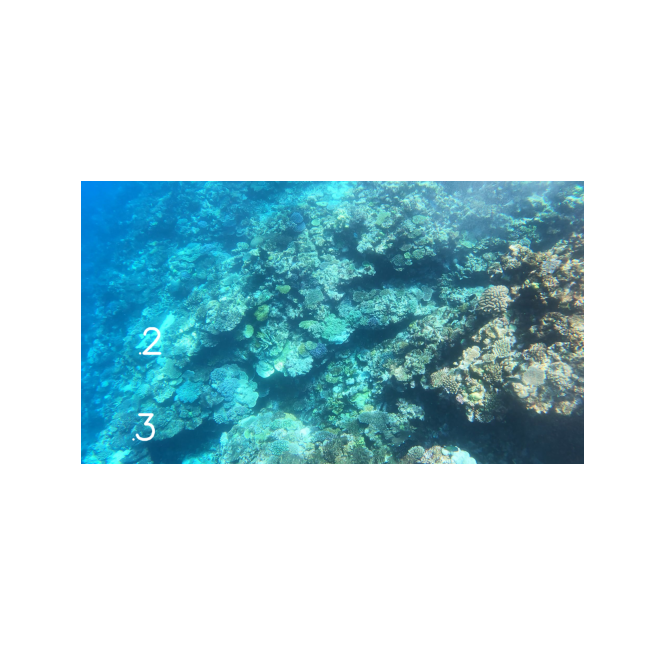

Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [15]:
import time
frame_id = 0
n_frames = 30
images = []

# Norfair https://github.com/tryolabs/norfair/blob/master/docs/README.md
tracker = Tracker(
    distance_function=euclidean_distance, 
    distance_threshold=30,
    hit_inertia_min=3,
    hit_inertia_max=6,
    initialization_delay=1,
)

for i, val_fn in enumerate(val_fns[35:]):
    if i >= n_frames: break
    
    img = cv2.cvtColor(
        cv2.imread(val_fn),
        cv2.COLOR_BGR2RGB
    )
    pred = reef_detector(img, augment=False)
    
    detects = [[*p[:5]] for p in pred]
    tracked_objects = tracker.update(
        detections=to_norfair(detects, frame_id))
    
    draw_tracked_objects(
        img,
        tracked_objects,
        id_size=3,
        color=(255,255,255),
        id_thickness=5
    )
    images.append(img)
    
create_animation(images)

In [21]:
from tqdm.auto import tqdm

def compute_f2(
    val_fns, reef_detector, augment=False,
    count_only_nonempty=False, count_max_samples=None, count_every_nth=1, validate_detections=False):
    boxtractor = Boxtractor()
    
    imagewise_f2s = []
    all_tps, all_fps, all_fns = [0 for _ in range(11)], [0 for _ in range(11)], [0 for _ in range(11)]
    for i, img_fn in tqdm(enumerate(val_fns[::count_every_nth])):
        if count_max_samples is not None:
            if i >= count_max_samples:
                break

        img = cv2.cvtColor(
            cv2.imread(img_fn),
            cv2.COLOR_BGR2RGB
        )
        im_h, im_w = img.shape[:2]

        gts = []
        with open(img_fn.replace('/images/','/labels/').replace('.png','.txt').replace('.jpg','.txt')) as f:
            annos = f.readlines()

        for anno in annos:
            lbl, xc, yc, w, h = anno.split(' ')
            xc = float(xc) * im_w
            yc = float(yc) * im_h
            w = float(w) * im_w
            h = float(h) * im_h
            x = (xc - w / 2)
            y = (yc - h / 2)
            gts.append([
                x,y,w,h
            ])
        
        if len(gts) == 0 and count_only_nonempty:
            continue

        pred = reef_detector(
            img, augment=augment)
        
        
        if validate_detections:
            pred_crops = boxtractor.boxtract(img, pred)
            good_pred = []
            for p, crop in zip(pred, pred_crops):
                pred_mask = learn_validator.predict(crop)
                pred_height = p[3]-p[1]
                pred_width = p[2]-p[0]
                if validate_pred_box(
                    pred_mask[0].detach().numpy()[0], pred_height, pred_width
                ):
                    good_pred.append(p)
            pred = good_pred
        
        preds_xywh = [
            [
                p[0], 
                p[1],
                p[2] - p[0],
                p[3] - p[1],
            ] for p in pred
        ]
        
        # box format : x,y,w,h
        ious = maskUtils.iou(preds_xywh, gts, [0]*len(gts))
        if len(ious) == 0:
            f2s = [0 for _ in range(11)]
            tps = [0 for _ in range(11)]
            fps = [0 for _ in range(11)]
            fns = [len(gts) for _ in range(11)]
        else:
            f2s, tps, fps, fns = f2_at_3_to_8(ious)
        for th_i, (tp,fp,fn) in enumerate(zip(tps,fps,fns)):
            all_tps[th_i] += tp
            all_fps[th_i] += fp
            all_fns[th_i] += fn
        
        imagewise_f2s.append(np.mean(f2s))

    imagewise_f2s = np.array(imagewise_f2s)
    competition_f2 = np.mean(
        np.array(
            [f2_score(all_tps[th_i], all_fps[th_i], all_fns[th_i]) for th_i in range(11)]
        ))
    return competition_f2, imagewise_f2s

In [28]:
reef_detector = ReefDetector(
        weights=yolo_model,
        im_size=1280,
        conf_thres=0.20,
        device='cuda',
        hub_path='../yolov5/'
)
competition_f2, _ = compute_f2(
        val_fns, reef_detector, augment=False,
        count_max_samples=None, count_every_nth=1, validate_detections=True)
print(f'f2 {competition_f2}')

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 
Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 


0it [00:00, ?it/s]

f2 0.5290757352613022


In [ ]:

f2 0.5257206208425721
f2 0.5290757352613022

In [25]:
conf_ths = np.arange(0.1, 0.3, 0.05)
competition_f2s = []
for th in conf_ths:
    print(f'th {th}')
    reef_detector = ReefDetector(
        weights=yolo_model,
        conf_thres=th,
        device='cuda',
        hub_path='../yolov5/'
    )
    competition_f2, _ = compute_f2(
        val_fns, reef_detector, augment=False,
        count_max_samples=None, count_every_nth=1)
    print(f'f2 {competition_f2}')
    competition_f2s.append(competition_f2)

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


th 0.1


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


f2 0.6113436736274107
th 0.15000000000000002


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


f2 0.6142824385376706
th 0.20000000000000004


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.1 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 7982MiB)

Fusing layers... 


f2 0.6117071334462639
th 0.25000000000000006


Model Summary: 367 layers, 46108278 parameters, 0 gradients, 107.8 GFLOPs
Adding AutoShape... 


KeyboardInterrupt: 

### th 0.2
- f2 0.6287531347425933

### th 0.2 with default augmentations
- f2 0.6240847876707396

### th 0.2 with custom augmentations [s1, s1.1LR, s1.2]
- f2 0.6547765946560888

In [27]:
plt.plot(conf_ths, competition_f2s)
plt.show()

/tmp/ipykernel_559394/462841140.py:2: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [246]:
plt.plot(
    [i for i in range(len(imagewise_f2s))],
    imagewise_f2s
)
plt.show()

In [244]:
competition_f2, _ = compute_f2(
        val_fns, reef_detector,
        conf_thres=0.05)

In [245]:
competition_f2

0.6134194923105429